# Advanced Lane Finding Project

The goals / steps of this project are the following:

* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
* Apply a distortion correction to raw images.
* Use color transforms, gradients, etc., to create a thresholded binary image.
* Apply a perspective transform to rectify binary image ("birds-eye view").
* Detect lane pixels and fit to find the lane boundary.
* Determine the curvature of the lane and vehicle position with respect to center.
* Warp the detected lane boundaries back onto the original image.
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

---


## Calibrating the Camera

Here I've created a `Camera` class that exposes few functions to find compute/write/read calibration data & undistort images

In [1]:
import os
from glob import glob

from src.camera import Camera, CALIBRATION_DATA_PATH

calibration_images = glob("camera_cal/calibration*.jpg")

if not os.path.exists(CALIBRATION_DATA_PATH):
    print("Calibrating camera...")
    calib_data = Camera.calibrate(calibration_images)
    # Save calibration data
    Camera.save_calibration(CALIBRATION_DATA_PATH, calib_data)
    print(">> Calibrating completed. Data stored at", CALIBRATION_DATA_PATH)
else:
    print(">> Will use Calibration data file")

>> Will use Calibration data file


Now the we have the calibration data saved, we can directly load it and use it to undistort the images

<Figure size 432x288 with 0 Axes>

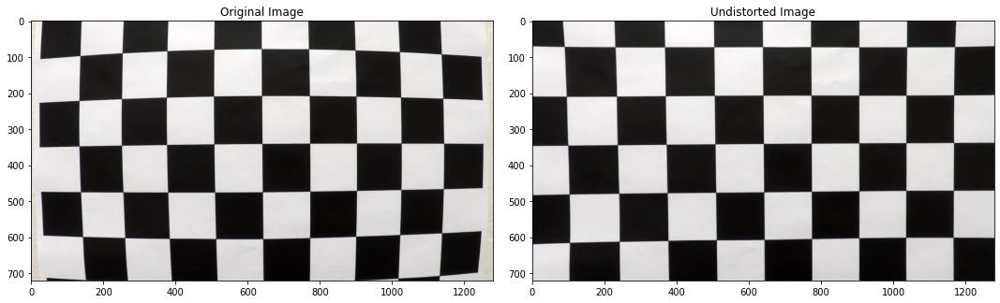

In [1]:
import cv2

from src.camera import Camera, CALIBRATION_DATA_PATH
from src.utils import compare_imgs

test_img = cv2.imread("./camera_cal/calibration1.jpg")

calib_data = Camera.load_calibration(CALIBRATION_DATA_PATH)
undistorted = Camera.undistort(test_img, calib_data)

compare_imgs(test_img, undistorted, title1="Original Image", title2="Undistorted Image")

## Full pipeline

<Figure size 432x288 with 0 Axes>

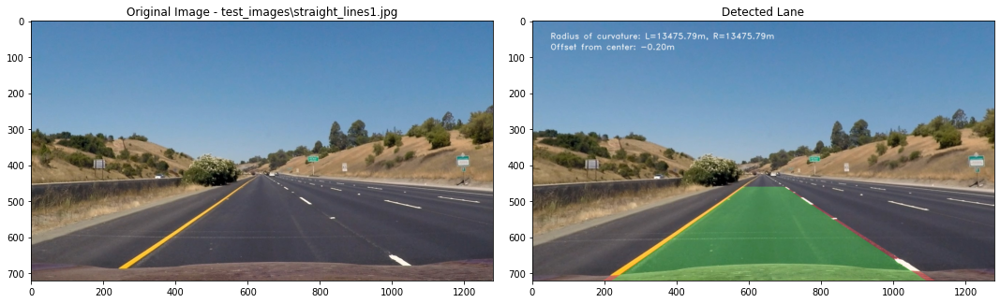

<Figure size 432x288 with 0 Axes>

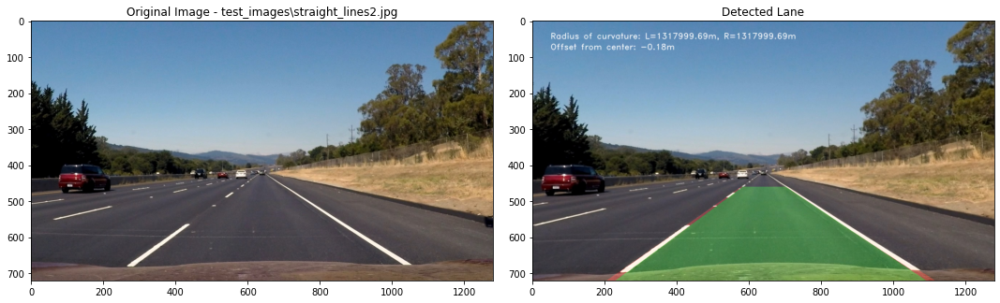

<Figure size 432x288 with 0 Axes>

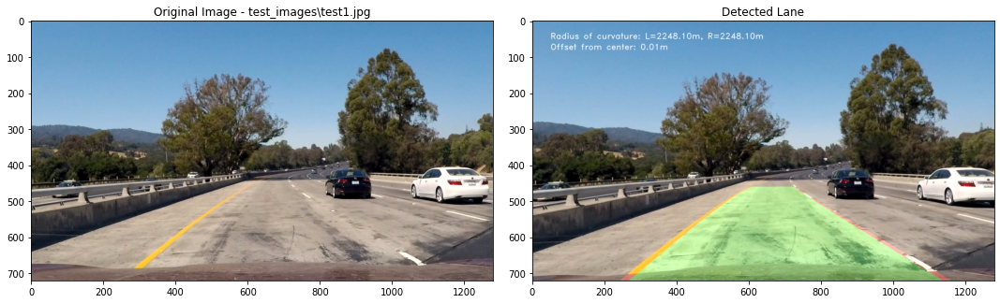

<Figure size 432x288 with 0 Axes>

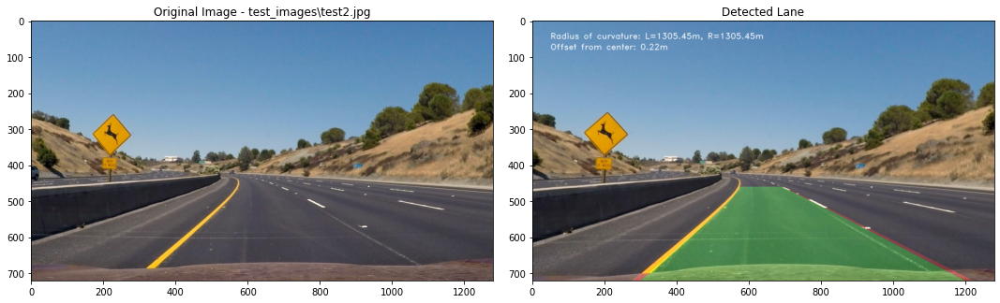

<Figure size 432x288 with 0 Axes>

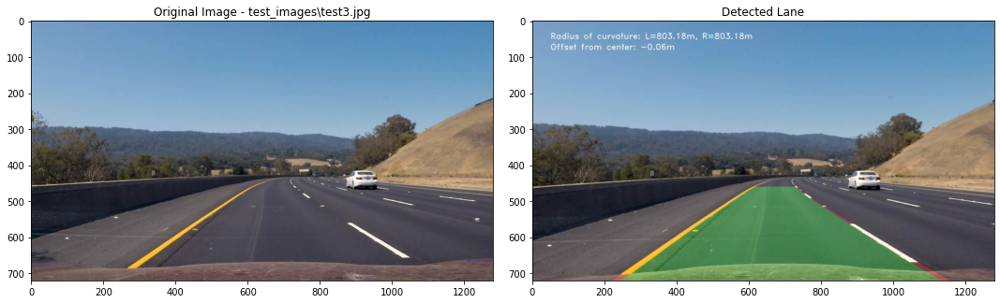

<Figure size 432x288 with 0 Axes>

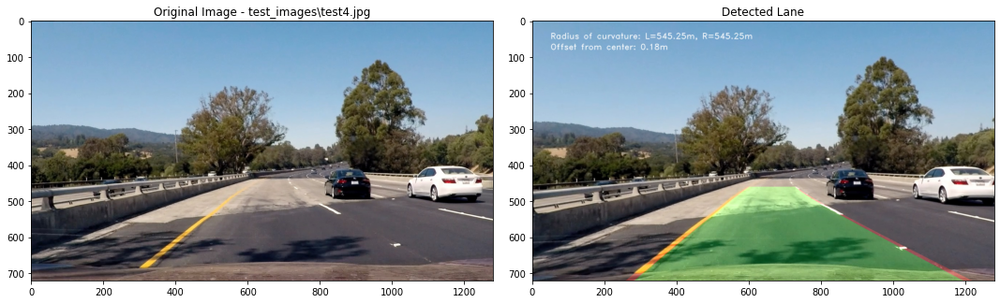

<Figure size 432x288 with 0 Axes>

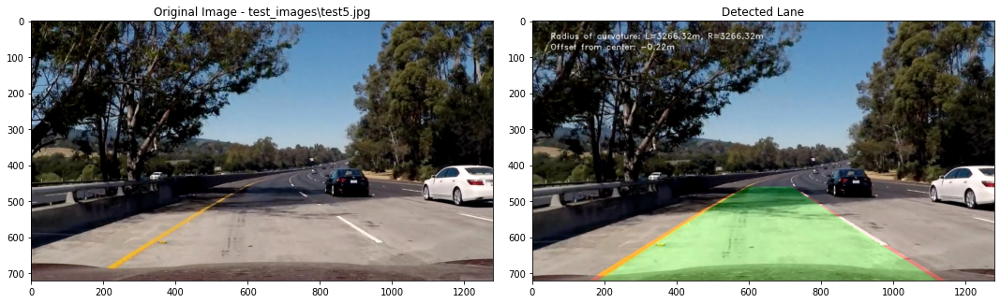

<Figure size 432x288 with 0 Axes>

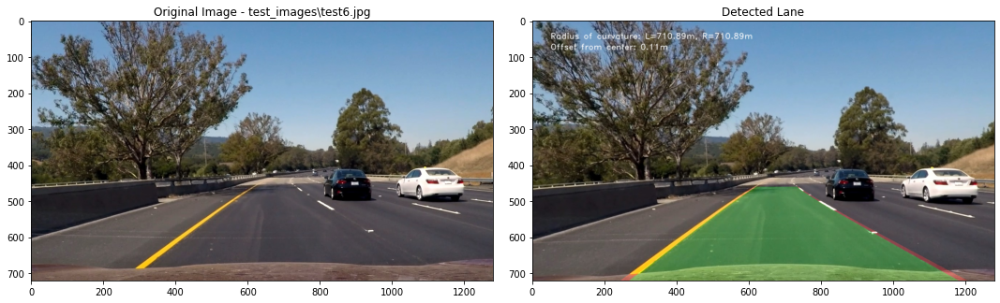

In [3]:
from pathlib import Path

import cv2

from src.pipeline import LaneDetection
from src.camera import Camera, CALIBRATION_DATA_PATH
from src.utils import compare_imgs


src_dir = Path("./test_images/")
out_dir = Path("./test_images_output/")
out_dir.mkdir(parents=True, exist_ok=True)

LANE_DETECTION_ARGS = {
    "calibration_data": Camera.load_calibration(CALIBRATION_DATA_PATH),
    "sobel_kernel": 15,
    "sobel_thresh": (20, 200),
    "magnitude_thresh": (20, 200),
    "direction_thresh": (0.2, 1.3),
    "hsv_thresh": [(0, 0, 200), (179, 255, 255)],
    "hls_thresh": [(0, 170, 0), (179, 255, 255)],
    "lab_thresh": [(0, 0, 140), (255, 255, 255)],
    "sw_count": 10,
    "sw_width": 160,
    "sw_minpix": 200,
    "search_width": 40,
    "draw_metrics": True,
    "draw_gradient": False,
    "draw_lane_search": False,
}

for path in src_dir.glob("*.jpg"):
    img = cv2.imread(str(path))
    result, original = LaneDetection().detect_and_render(img, **LANE_DETECTION_ARGS)
    cv2.imwrite(str(out_dir/path.name), result)
    compare_imgs(original, result, title1=f"Original Image - {path}", title2="Detected Lane")

# Videos

In [4]:
from functools import partial
from pathlib import Path

import cv2
from IPython.display import HTML
from moviepy.editor import VideoFileClip

from src.camera import CALIBRATION_DATA_PATH, Camera
from src.pipeline import LaneDetection

LANE_DETECTION_ARGS = {
    "calibration_data": Camera.load_calibration(CALIBRATION_DATA_PATH),
    "sobel_kernel": 15,
    "sobel_thresh": (20, 200),
    "magnitude_thresh": (20, 200),
    "direction_thresh": (0.2, 1.3),
    "hsv_thresh": [(0, 0, 150), (179, 255, 255)],
    "hls_thresh": [(0, 160, 0), (179, 255, 255)],
    "lab_thresh": [(0, 0, 180), (255, 255, 255)],
    "sw_count": 10,
    "sw_width": 160,
    "sw_minpix": 200,
    "search_width": 40,
    "draw_metrics": True,
    "draw_gradient": False,
    "draw_lane_search": False,
}

def lane_detection_pipeline(frame, detector=None):
    # moviepy returns an RGB image. Convert to BGR for our pipeline
    frame = cv2.cvtColor(frame, cv2.COLOR_RGB2BGR)

    # Run lane detection for the current frame
    result, _ = detector.detect_and_render(frame, **LANE_DETECTION_ARGS)

    # Convert the result back to RGB for moviepy
    return cv2.cvtColor(result, cv2.COLOR_BGR2RGB)


out_dir = Path("./test_videos_output")
out_dir.mkdir(exist_ok=True)


In [5]:
video_src = Path("./test_videos/project_video.mp4")
video_output = out_dir / video_src.name

# Create a new lane detection instance
detector = LaneDetection()

# Start applying lane detection to the video clip
src_clip = VideoFileClip(str(video_src), audio=False)
result_clip = src_clip.fl_image(partial(lane_detection_pipeline, detector=detector))
%time result_clip.write_videofile(str(video_output), audio=False)

# Display the video (for python notebook)
HTML(f'<video controls><source src="{video_output}"></video>')

In [7]:
video_src = Path("./test_videos/challenge_video.mp4")
video_output = out_dir / video_src.name

# Create a new lane detection instance
detector = LaneDetection()

# Start applying lane detection to the video clip
src_clip = VideoFileClip(str(video_src), audio=False)
result_clip = src_clip.fl_image(partial(lane_detection_pipeline, detector=detector))
%time result_clip.write_videofile(str(video_output), audio=False)

HTML(f'<video controls><source src="{video_output}"></video>')